# Image Similarity & Retrieval System (fastai)

The overall goal of this project is train a set of models to determine when provided a new image (in this case a frame from one of the MCU movies), we seek to provide an output of the closest __similar images__ related to the queries image/scene. In other words, given an image and a library of images, retireve the closes K similar images to queried image. This objective is achieved by:
* leverage pre-trained models to extract features of images and index the nearest neighbor
* Retrieve similar images by calculating similarity distances between inquired image and images in the databse. 

### Import Packages

First we make sure any libraries that are edited during project development and experiments are reset reload automatically. Addiitonally we are utilizing the FastAI livrary that sits on top of Pytorch. Unlike other notebooks in this repo, we are using Pytorch instead of Tensorflow, however you can think of the fastAI library to Pytorch similar to Keras is to Tensorflow. 

In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
# fast.ai libraries
from fastai.vision import *
from fastai.callbacks.hooks import *
from fastai.metrics import accuracy, top_k_accuracy

# data/image/graphing processing libraries
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

## similarity libraries
#!pip install lshash3==0.0.8
from lshash.lshash import LSHash


### Data Processing and Augmentation

Fastai is great, we can utilize thier builtin `get_transforms()` to transform a bunch of images per our specificaions.

In [3]:
path = Path('./images/image_folders/')
path.ls()[:8]

[PosixPath('images/image_folders/thorragnarok'),
 PosixPath('images/image_folders/thor2darkworld'),
 PosixPath('images/image_folders/ironman2'),
 PosixPath('images/image_folders/avengers3'),
 PosixPath('images/image_folders/drstrange'),
 PosixPath('images/image_folders/guardians2'),
 PosixPath('images/image_folders/lsh_101519.p'),
 PosixPath('images/image_folders/avengers2')]

Defining image transformaitons. Here we since the image database is relatively small, some augmentation is faverable, however, we want to limit any significant distortion to the data such as `warp` and `zoom`. 

In [4]:
# get_transforms??
# Experiment 1
tfms = get_transforms(
    do_flip=False, 
    flip_vert=False, 
    max_rotate=0, 
    max_lighting=0, 
    max_zoom=1, 
    max_warp=0
)

__Test/Train Split__

Here we import all of the images at the image_folder path utilizing the fastai `ImageList.from_folder()` function to reach and split and augment images at run time prior to training. 

__Details__
* batch size = 64 as we expect most images to be medium size on the GPU for training
* image resolution = 224 x 224

In [5]:
# get_transforms??
#tfms = get_transforms()

data = (ImageList.from_folder(path)
        .split_by_rand_pct(0.2)
        .label_from_folder()
        .transform(tfms=tfms, size=224)
        .databunch(bs=64)
        .normalize(imagenet_stats))

print("------ Data Specifications ------")
print(data)

print("------ Data Set Specifications ------")
print("Number of train images:  ", len(data.train_ds.x))
print("Number of test images :  ",len(data.valid_ds.x))
print("Number of image folders: ",len(data.classes))
print(data.classes)

# save created training data 
data.save('mcu_data_101719.pkl')

------ Data Specifications ------
ImageDataBunch;

Train: LabelList (3617 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
thorragnarok,thorragnarok,thorragnarok,thorragnarok,thorragnarok
Path: images/image_folders;

Valid: LabelList (904 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
mcu_images,thor2darkworld,mcu_images,mcu_images,mcu_images
Path: images/image_folders;

Test: None
------ Data Set Specifications ------
Number of train images:   3617
Number of test images :   904
Number of image folders:  21
['antman1', 'antman2', 'avengers1', 'avengers2', 'avengers3', 'avengers4', 'blackpanther', 'capamerica1', 'capamerica2', 'capamerica3', 'capmarvel', 'drstrange', 'guardians1', 'guardians2', 'ironman2', 'mcu_images', 'spidermanhomecoming', 'spiderverse', 'test', 'thor2darkworld', 'thorragnarok']


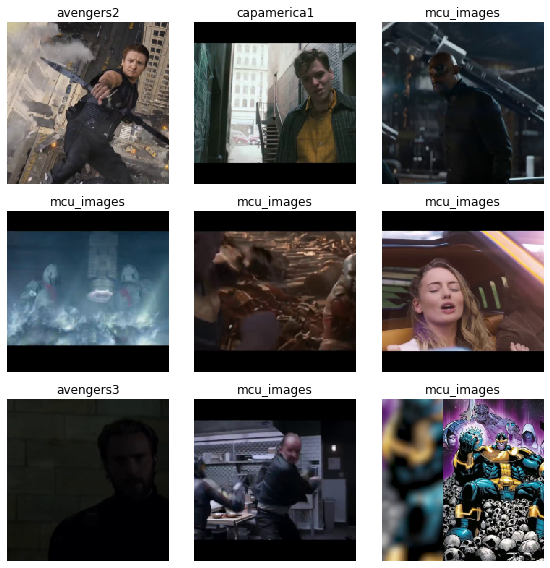

In [6]:
data.show_batch(rows=3, figsize=(8,8))

Below is an example of the various transformations the `get_transforms()` functions provides

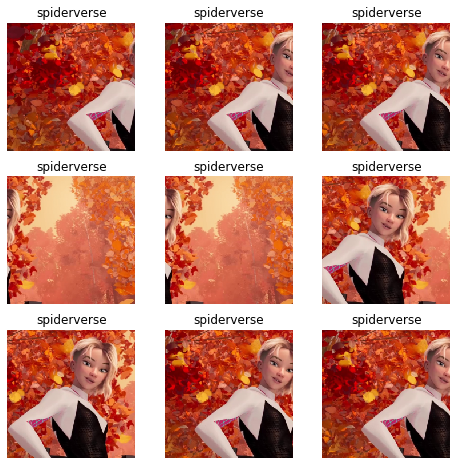

In [6]:
def _plot(i, j, ax):
    x, y = data.train_ds[432]
    x.show(ax, y=y)
plot_multi(_plot, 3, 3, figsize=(8, 8))

In [8]:
data.train_ds.to_df().head()

,x,y
0,thorragnarok/thorragnarok_37.jpg,thorragnarok
1,thorragnarok/thorragnarok_67.jpg,thorragnarok
2,thorragnarok/thorragnarok_23.jpg,thorragnarok
3,thorragnarok/thorragnarok_30.jpg,thorragnarok
4,thorragnarok/thorragnarok_69.jpg,thorragnarok


In [9]:
data.valid_ds.x.items

array([PosixPath('images/image_folders/mcu_images/mcu_recap_cramit_300.jpg'),
       PosixPath('images/image_folders/guardians1/guardians1_69.jpg'),
       PosixPath('images/image_folders/mcu_images/most_powerful_heros_mcu_128.jpg'),
       PosixPath('images/image_folders/drstrange/drstrange_14.jpg'), ...,
       PosixPath('images/image_folders/mcu_images/most_powerful_heros_mcu_397.jpg'),
       PosixPath('images/image_folders/mcu_images/mcu_recap_cramit_732.jpg'),
       PosixPath('images/image_folders/thorragnarok/thorragnarok_2.jpg'),
       PosixPath('images/image_folders/guardians1/guardians1_67.jpg')], dtype=object)

thorragnarok


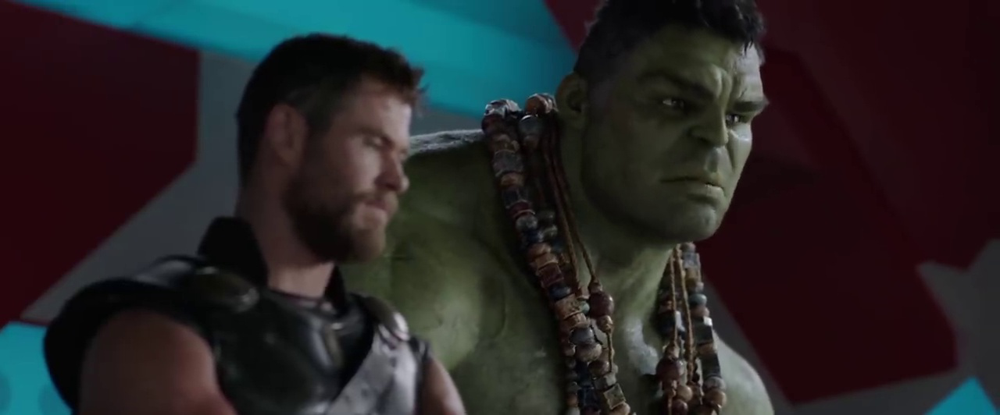

In [10]:
print(data.train_ds.y[1])
data.train_ds.x[1]

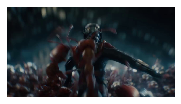

In [11]:
img= open_image(get_image_files(path/'antman1')[20])
img.show()

## Model Training - ResNet34

Next is model traning. We are utilizing a __Residual Network w/ 34 layers__ (ResNet34) neural network model that will take images as an input and output predicted probabilities for each category (e.g., movie). We are using a fully connected convolutional neural network with a single hidden layer as a classiffier. 

Whats a Convolutional Neural Network, here is a great crash course - http://cs231n.github.io/convolutional-networks/


additional architectural details:
* performance metric denoting success of model training:
    * validation accuracy
    * Top-k accuracy - the percent the classifier did not include the correct class among the top k _(e.g., 5)_ probabilities 
* dropout regularization = 0.5 (final layer); 0.25 (remaining layers)

In [7]:
top_k5_accuracy = partial(top_k_accuracy, k=5)

# downoad pretrained model and create
learn = cnn_learner(data, models.resnet34, pretrained=True, 
                    metrics=[accuracy, top_k5_accuracy ])

# prints out model parameters
learn.model[1]
#learn.summary()

Sequential(
  (0): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=1)
    (mp): AdaptiveMaxPool2d(output_size=1)
  )
  (1): Flatten()
  (2): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=1024, out_features=512, bias=True)
  (5): ReLU(inplace=True)
  (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Dropout(p=0.5, inplace=False)
  (8): Linear(in_features=512, out_features=21, bias=True)
)

We utilize `lr_find()` function to run an experimental trial to determine an appropriate learning rate. 

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.31E-02
Min loss divided by 10: 1.20E-02


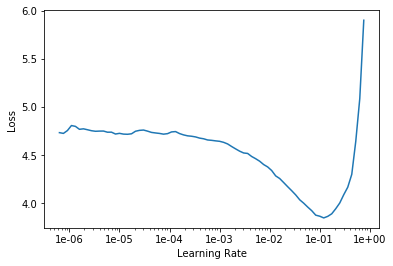

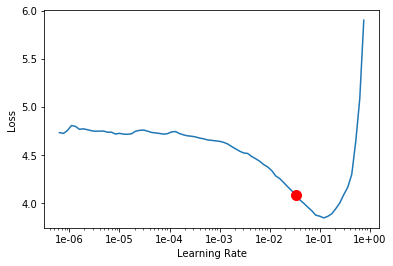

In [8]:
learn.lr_find()
learn.recorder.plot()


#suggest learing rate
learn.recorder.plot(suggestion=True)

#### Finetube last layer

Time to start training. We will use fit `one-cycle-policy` to finetune the last laer and leave the rest untouched. We will initiate training for a cyle of 10 epochs. Depending on the amount of data... well, generally, its best to use a gpu for the next couple of cells. 

In [9]:
#learn.fit_one_cycle(10, max_lr=slice(1e-4,1e-3))
learn.fit_one_cycle(10, max_lr=1e-3)

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,4.398236,3.213084,0.129425,0.386062,00:45
1,3.618551,2.124957,0.459071,0.704646,00:44
2,2.726763,1.396876,0.651549,0.863938,00:43
3,2.074635,1.232736,0.703540,0.898230,00:44
4,1.666117,1.146722,0.701327,0.920354,00:44
5,1.407210,1.067336,0.704646,0.922566,00:44
6,1.232852,1.066121,0.704646,0.938053,00:44
7,1.111129,1.034272,0.712389,0.933628,00:44
8,1.035337,1.016145,0.714602,0.933628,00:43
9,0.992827,1.022795,0.714602,0.931416,00:44


After 10 epochs we have an accuracy of 72%

#### Learning Curve
Below is the training earning curve by batch plosses on losses. 

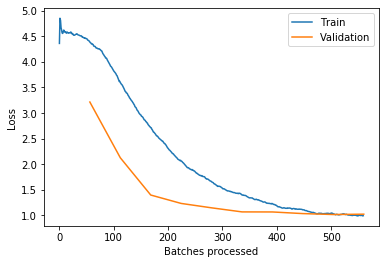

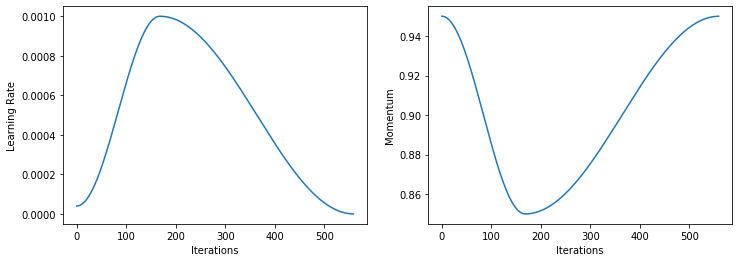

In [10]:
#learn.unfreeze()
learn.recorder.plot_losses();
learn.recorder.plot_lr(show_moms=True)


The loss curves appears the model conversed well during training and learned rate was approriately fitting. 

#### Save Model
Satisfied with the training results, we turn to saving the model.

In [11]:
#learn.freeze()
learn.save('mcu_resnet34_102219')
model = learn.model

__Load Model__

In [ ]:
#learn.load('mcu_resnet34_101619')

In [21]:
# save learning information
#learn.export('mcu_resnet34_101519.pkl')

In [5]:
# load model leraner
#learn = load_learner(path, file= 'mcu_resnet34_101519.pkl')

In [23]:
learn.load('mcu_resnet34_101719')
model = learn.model

## Creating Image Features & KNN Graphs

The resnet34 is utilizing the Convolutional Neural Network (CNN) architecture, in which the above training took each of the images from the image library and determined specific feature on that images (e.g., shape, edges, faces) to develop an understanding of what the image contains. 

We utilize fastai `Hook()` callback wrapper for intercept and modifying the training loop at runtime. Specifically in this case we will save the image features using this callback. 

details on cusotm-fastai callbakcs - https://laurenth.me/2019/06/10/custom-fastai-callbacks
docks on Hook integration from fastao - https://docs.fast.ai/callback.html#Methods-your-subclass-can-implement

In [12]:
# https://jovian.ml/gautham20/e6bd87b3597e4a12bb601216b4d2289d
class Hook():
    "Create a hook on `m` with `hook_func`."
    def __init__(self, m:nn.Module, hook_func:HookFunc, is_forward:bool=True, detach:bool=True):
        self.hook_func,self.detach,self.stored = hook_func,detach,None
        f = m.register_forward_hook if is_forward else m.register_backward_hook
        self.hook = f(self.hook_fn)
        self.removed = False

    def hook_fn(self, module:nn.Module, input:Tensors, output:Tensors):
        "Applies `hook_func` to `module`, `input`, `output`."
        if self.detach:
            input  = (o.detach() for o in input ) if is_listy(input ) else input.detach()
            output = (o.detach() for o in output) if is_listy(output) else output.detach()
        self.stored = self.hook_func(module, input, output)

    def remove(self):
        "Remove the hook from the model."
        if not self.removed:
            self.hook.remove()
            self.removed=True

    def __enter__(self, *args): return self
    def __exit__(self, *args): self.remove()
        
def get_output(module, input_value, output):
    return output.flatten(1)

def get_input(module, input_value, output):
    return list(input_value)[0]

def get_named_module_from_model(model, name):
    for n, m in model.named_modules():
        if n == name:
            return m
    return None

#### Create Image DataFrame from Feature 
Now that we have the featuers for the images, before we can compute the similarity, we will create a dataframe for each of the images so the featues can be used in later experiments.

In [13]:
# this is a hook (learned about it here: https://forums.fast.ai/t/how-to-find-similar-images-based-on-final-embedding-layer/16903/13)
#img_repr_map = {} #feature_map
feature_map = {}
train_images = data.train_dl.new(shuffle=False)
last_linear_layer = learn.model[1][4]

with Hook(last_linear_layer, get_output, True, True) as hook:
    for i, (xb, yb) in enumerate(train_images):
        bs = xb.shape[0]
        img_ids = train_images.items[i*bs: (i+1)*bs]
        result = model.eval()(xb)
        img_reprs = hook.stored.cpu().numpy()
        img_reprs = img_reprs.reshape(bs, -1)
        for img_id, img_repr in zip(img_ids, img_reprs):
            feature_map[img_id] = img_repr

Format feature vectors into dataframe for later preocessing. The dataframe will contain the image path, the image tensor, and label

In [34]:
df = pd.DataFrame(feature_map.items(), columns=['image_path', 'image_features'])
df['label'] = [data.classes[x] for x in data.train_ds.y.items[0:df.shape[0]]]
df['label_id'] = data.train_ds.y.items[0:df.shape[0]]
df.head()

,image_path,image_features,label,label_id
0,images/image_folders/thorragnarok/thorragnarok...,"[0.0, 1.283303, 0.0, 0.0, 0.66619736, 0.0, 2.9...",thorragnarok,20
1,images/image_folders/thorragnarok/thorragnarok...,"[0.8614717, 0.0, 0.0, 1.6292217, 0.94113517, 0...",thorragnarok,20
2,images/image_folders/thorragnarok/thorragnarok...,"[0.0, 0.0, 0.7990619, 0.0, 0.45184615, 0.0, 0....",thorragnarok,20
3,images/image_folders/thorragnarok/thorragnarok...,"[0.3805669, 0.0, 1.7589089, 0.0, 2.090791, 0.0...",thorragnarok,20
4,images/image_folders/thorragnarok/thorragnarok...,"[0.42377967, 0.0, 0.0, 2.1397316, 1.8587003, 0...",thorragnarok,20


Here is the path were we wills tore all of the model information from this experiment


In [35]:
#model_dir = Path('./model_config/')
df.to_csv("./model_config/mcu_resnet34_102219_features.csv")

In [15]:
from scipy.spatial.distance import cosine

def get_similar_images(img_index, n=10):
    base_img_id, base_vector, base_label  = df.iloc[img_index, [0, 1, 2]]
    cosine_similarity = 1 - df['img_repr'].apply(lambda x: cosine(x, base_vector))
    similar_img_ids = np.argsort(cosine_similarity)[-11:-1][::-1]
    return base_img_id, base_label, df.iloc[similar_img_ids]

def show_similar_images(similar_images_df):
    images = [open_image(img_id) for img_id in similar_images_df['img_id']]
    categories = [learn.data.train_ds.y.reconstruct(y) for y in similar_images_df['label_id']]
    return learn.data.show_xys(images, categories)

ironman2
images/image_folders/ironman2/ironman2_86.jpg


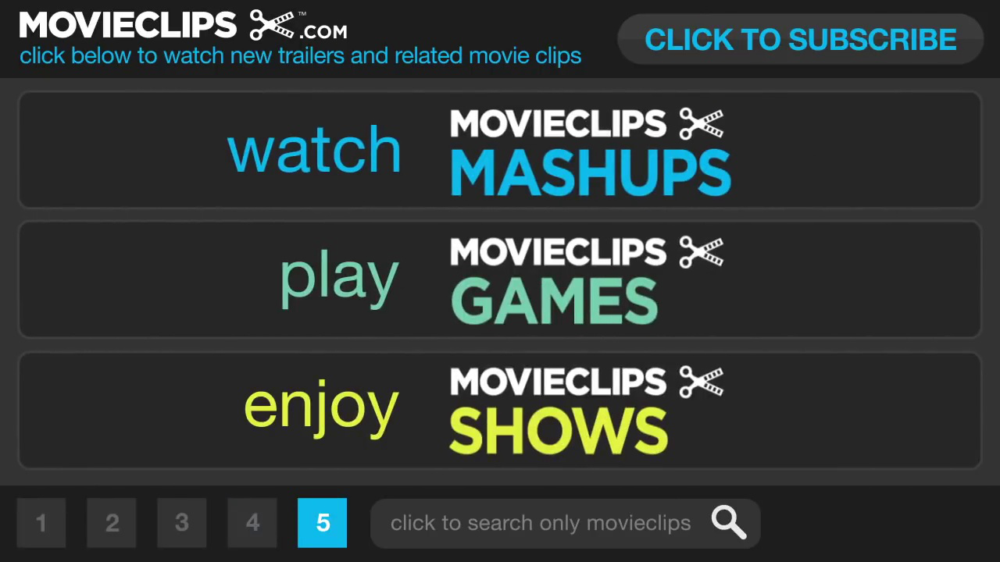

In [32]:
base_image, base_label, similar_images_df = get_similar_images(117) #6; 215
print(base_label)
print(base_image)
open_image(base_image)

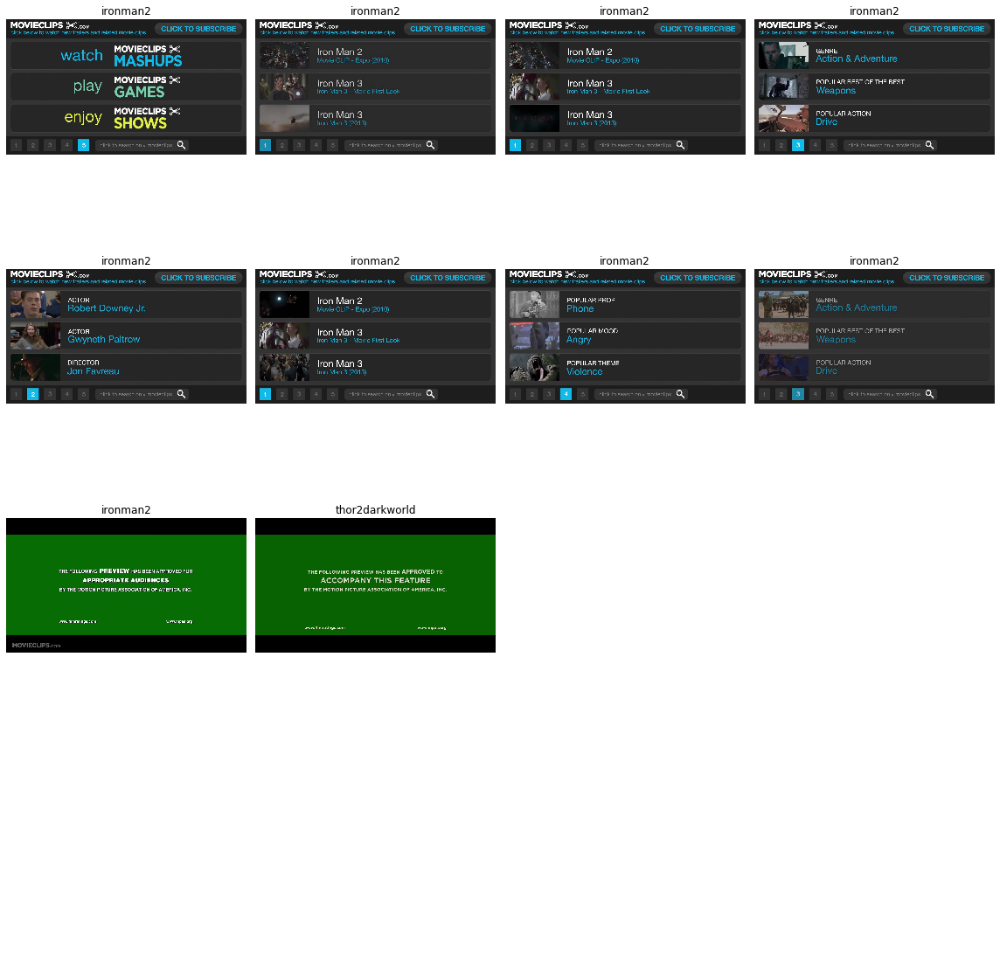

In [33]:
show_similar_images(similar_images_df)

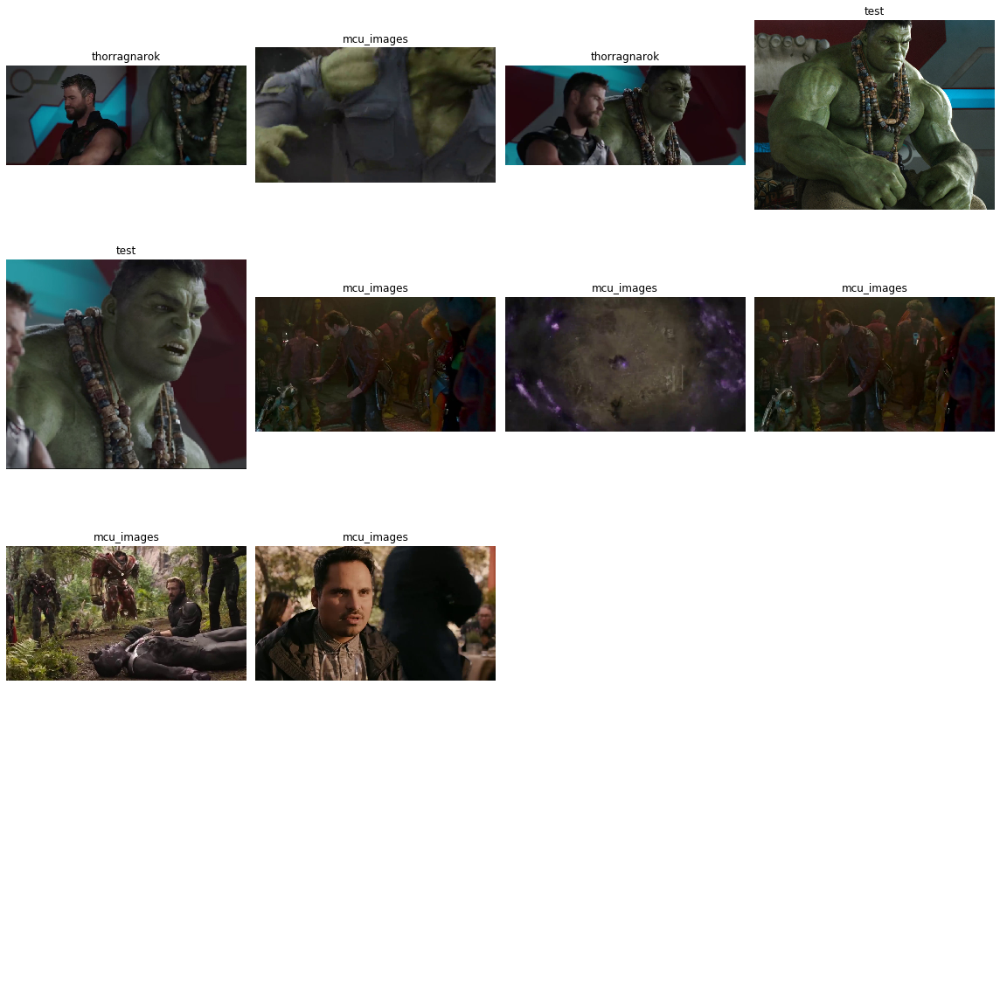

In [82]:
show_similar_images(similar_images_df)

_________

# Similary Images + ANNOY
https://jovian.ml/gautham20/deepfashion-similar-images-annoy

In [83]:
# https://jovian.ml/gautham20/e6bd87b3597e4a12bb601216b4d2289d
class Hook():
    "Create a hook on `m` with `hook_func`."
    def __init__(self, m:nn.Module, hook_func:HookFunc, is_forward:bool=True, detach:bool=True):
        self.hook_func,self.detach,self.stored = hook_func,detach,None
        f = m.register_forward_hook if is_forward else m.register_backward_hook
        self.hook = f(self.hook_fn)
        self.removed = False

    def hook_fn(self, module:nn.Module, input:Tensors, output:Tensors):
        "Applies `hook_func` to `module`, `input`, `output`."
        if self.detach:
            input  = (o.detach() for o in input ) if is_listy(input ) else input.detach()
            output = (o.detach() for o in output) if is_listy(output) else output.detach()
        self.stored = self.hook_func(module, input, output)

    def remove(self):
        "Remove the hook from the model."
        if not self.removed:
            self.hook.remove()
            self.removed=True

    def __enter__(self, *args): return self
    def __exit__(self, *args): self.remove()
        
def get_output(module, input_value, output):
    return output.flatten(1)

def get_input(module, input_value, output):
    return list(input_value)[0]

def get_named_module_from_model(model, name):
    for n, m in model.named_modules():
        if n == name:
            return m
    return None

In [84]:
linear_output_layer = get_named_module_from_model(model, '1.4')
inference_dataloader = data.train_dl.new(shuffle=False)

print(data.train_dl.dl.dataset)

LabelList (3617 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
thorragnarok,thorragnarok,thorragnarok,thorragnarok,thorragnarok
Path: images/image_folders


In [95]:
data.load('mcu_data_101719.pkl')

AttributeError: load

In [97]:
data.load

Object `data.load` not found.


In [85]:
import time
img_repr_map = {}

with Hook(linear_output_layer, get_output, True, True) as hook:
    start = time.time()
    for i, (xb, yb) in enumerate(inference_dataloader):
        bs = xb.shape[0]
        img_ids = inference_dataloader.items[i*bs: (i+1)*bs]
        result = model.eval()(xb)
        img_reprs = hook.stored.cpu().numpy()
        img_reprs = img_reprs.reshape(bs, -1)
        for img_id, img_repr in zip(img_ids, img_reprs):
            img_repr_map[img_id] = img_repr
        if(len(img_repr_map) % 2800 == 0):
            end = time.time()
            print(f'{end-start} secs for 12800 images')
            start = end

In [86]:
img_repr_df = pd.DataFrame(img_repr_map.items(), columns=['img_id', 'img_repr'])
img_repr_df.shape

(3584, 2)

In [87]:
img_repr_df['label'] = [data.classes[x] for x in data.train_ds.y.items[0:img_repr_df.shape[0]]]
img_repr_df['label_id'] = data.train_ds.y.items[0:img_repr_df.shape[0]]

In [18]:
img_repr_df.to_csv("./model_config/resnet34_img_repr_df_101719.csv")

### Getting similar images with cosine distance

In [88]:
import time

In [92]:
from scipy.spatial.distance import cosine

def get_similar_images(img_index, n=10):
    start = time.time()
    base_img_id, base_vector, base_label  = img_repr_df.iloc[img_index, [0, 1, 2]]
    cosine_similarity = 1 - img_repr_df['img_repr'].apply(lambda x: cosine(x, base_vector))
    similar_img_ids = np.argsort(cosine_similarity)[-11:-1][::-1]
    end = time.time()
    print(f'{end - start} secs')
    return base_img_id, base_label, img_repr_df.iloc[similar_img_ids]

def show_similar_images(similar_images_df):
    images = [open_image(img_id) for img_id in similar_images_df['img_id']]
    categories = [learn.data.train_ds.y.reconstruct(y) for y in similar_images_df['label_id']]
    return learn.data.show_xys(images, categories)

0.26807332038879395 secs
thorragnarok
images/image_folders/thorragnarok/thorragnarok_69.jpg


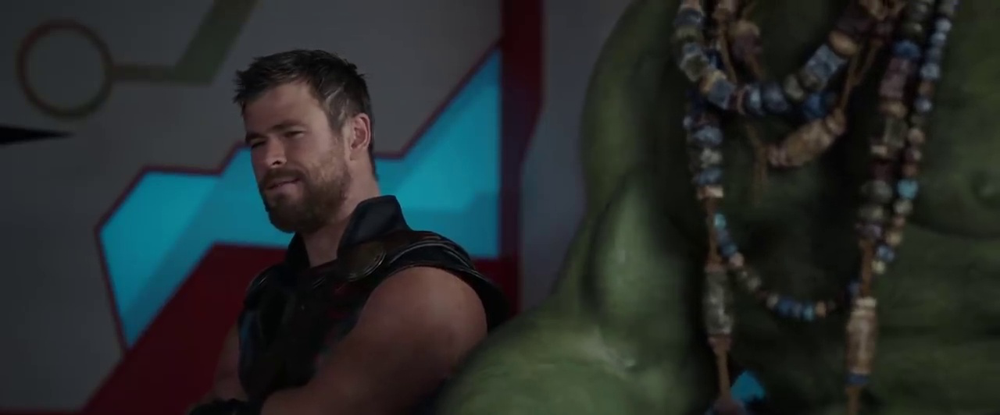

In [93]:
base_image, base_label, similar_images_df = get_similar_images(6) #6; 215
print(base_label)
print(base_image)
open_image(base_image)

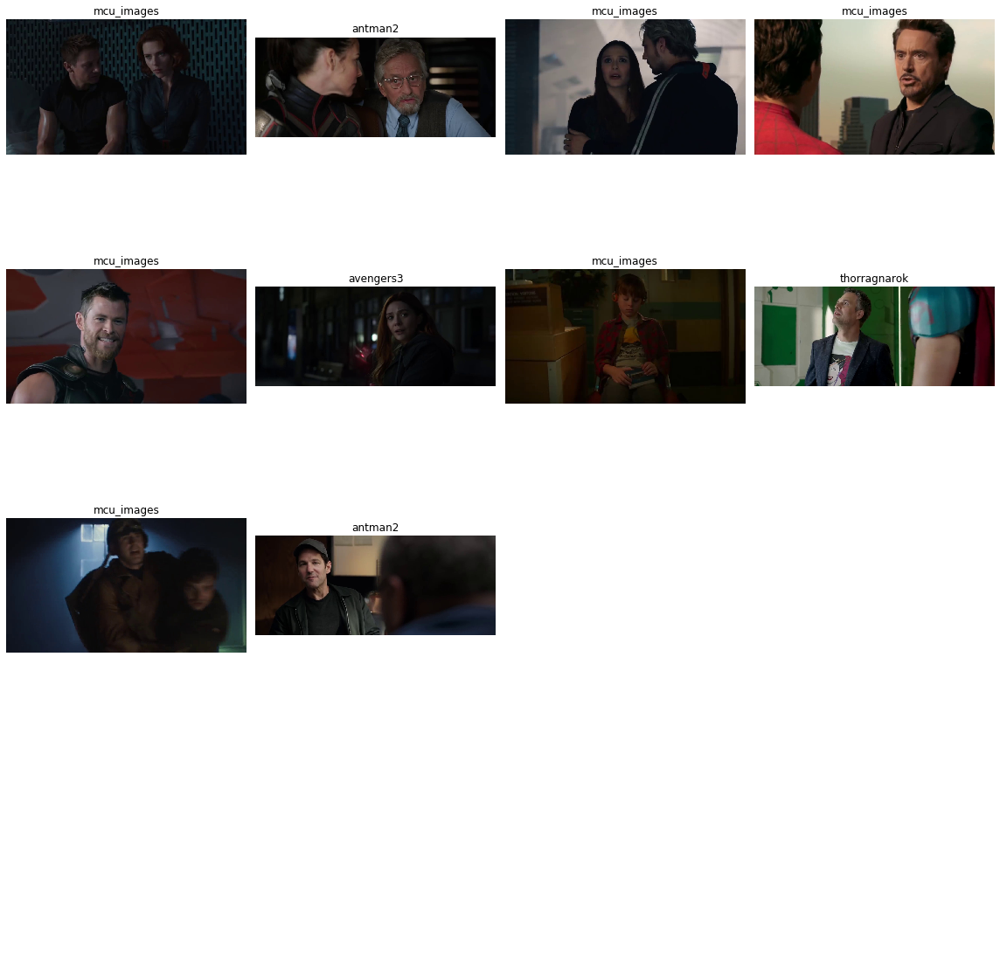

In [94]:
show_similar_images(similar_images_df)

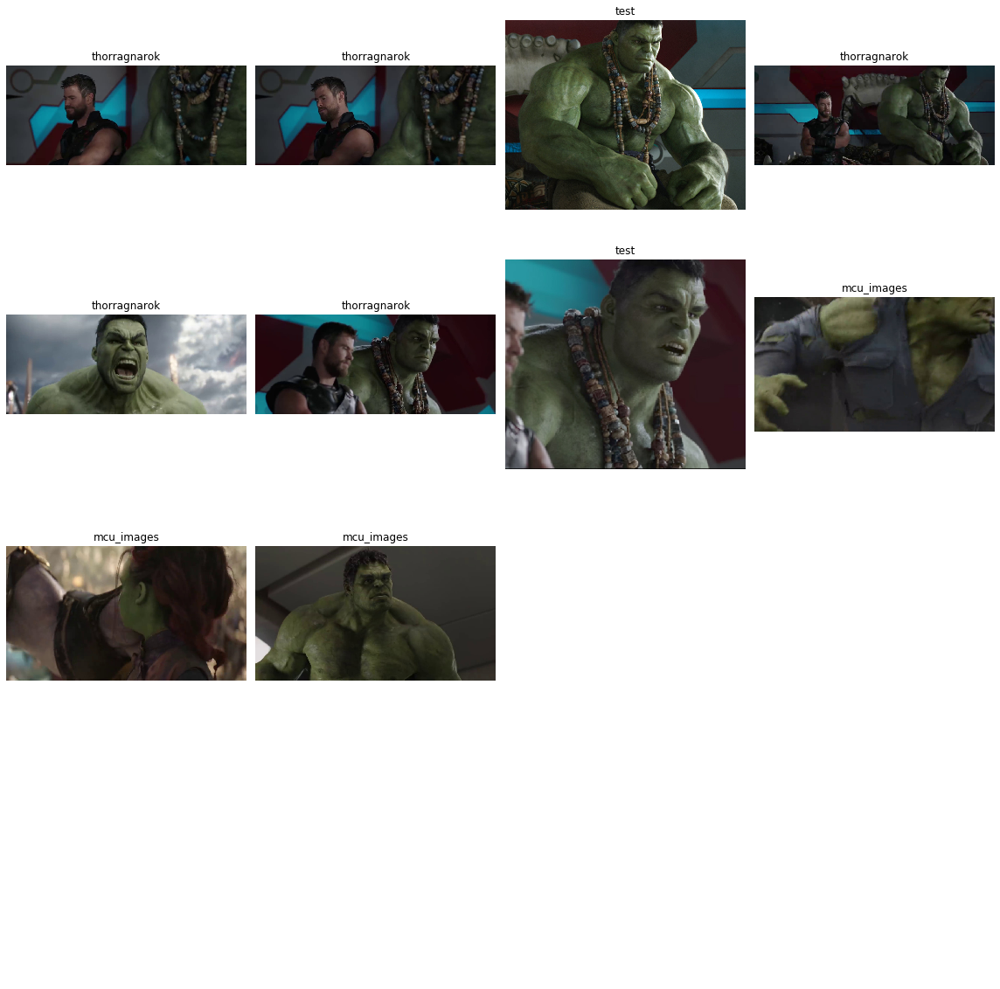

In [79]:
show_similar_images(similar_images_df)

0.2631402015686035 secs
thorragnarok
images/image_folders/thorragnarok/thorragnarok_69.jpg


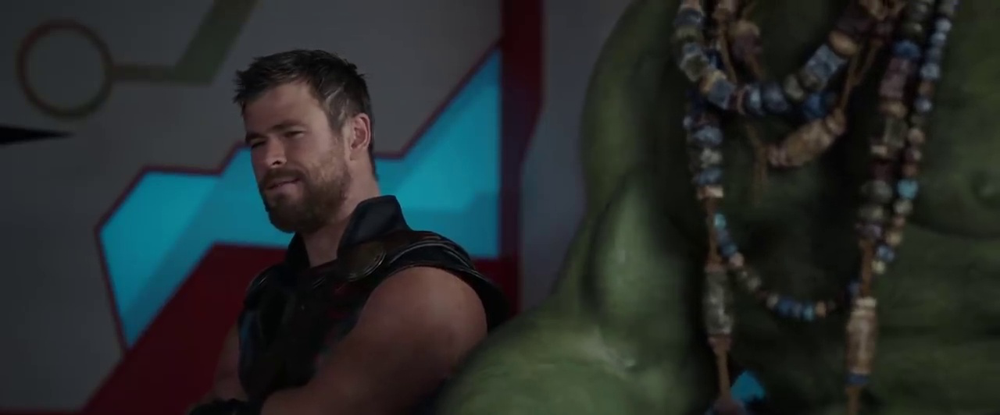

In [37]:
base_image, base_label, similar_images_df = get_similar_images(5) #6; 215
print(base_label)
print(base_image)
open_image(base_image)

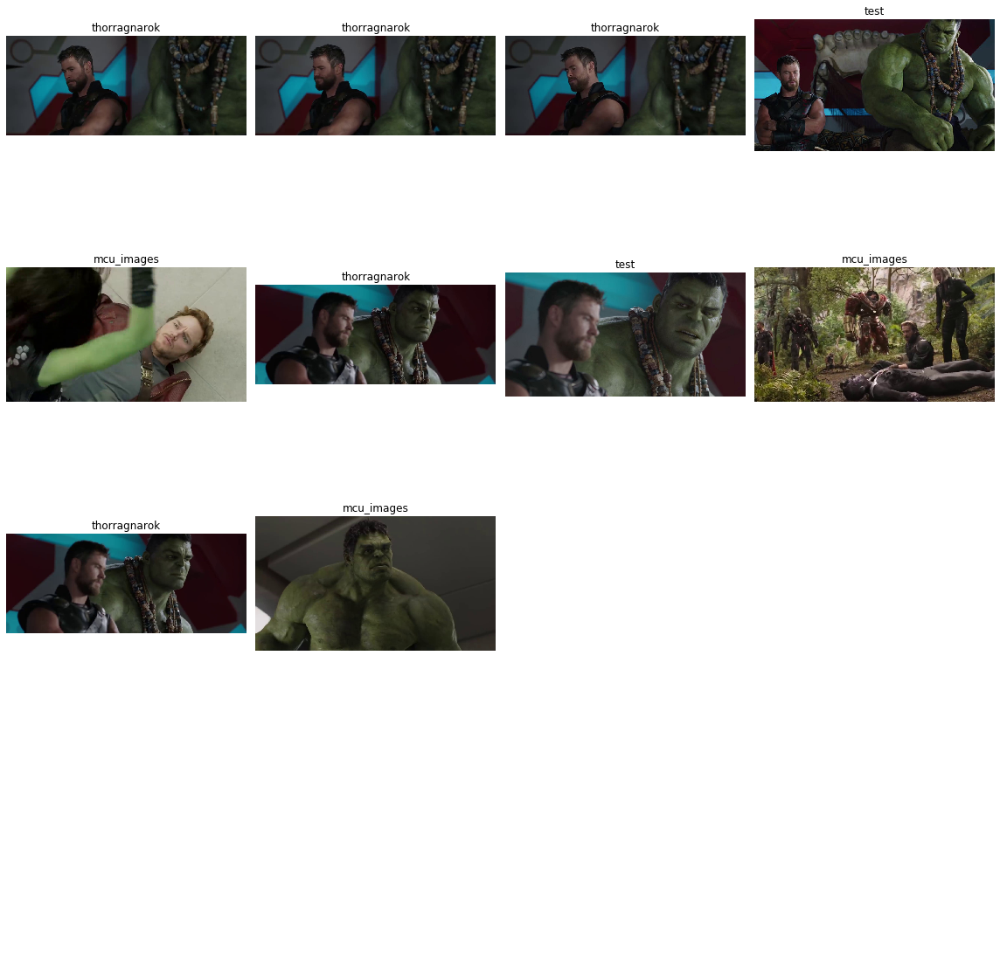

In [38]:
show_similar_images(similar_images_df)

----
## Annoy - Approximate Nearest Neighbor

In [25]:
from annoy import AnnoyIndex

In [71]:
img_repr_df = pd.read_csv("./model_config/img_repr_df_1015.csv", index_col=[0])
img_repr_df.head()

,img_id,img_repr,label,label_id
0,images/image_folders/thorragnarok/thorragnarok...,[0.420492 0. 1.273879 0. ... 1.919...,thorragnarok,20
1,images/image_folders/thorragnarok/thorragnarok...,[0. 0. 1.81775 0. ... 1.264...,thorragnarok,20
2,images/image_folders/thorragnarok/thorragnarok...,[0. 0. 0. 1.677334 ... 0. ...,thorragnarok,20
3,images/image_folders/thorragnarok/thorragnarok...,[0. 0. 0.604799 3.903214 ... 2.801...,thorragnarok,20
4,images/image_folders/thorragnarok/thorragnarok...,[0. 1.363608 1.789062 1.327476 ... 1.377...,thorragnarok,20


In [34]:
img_repr_df = df
img_repr_df.head()

,img_id,img_repr,label,label_id
0,images/image_folders/thorragnarok/thorragnarok...,"[0.8840012, 0.0, 0.1347482, 0.0, 5.0956626, 0....",thorragnarok,20
1,images/image_folders/thorragnarok/thorragnarok...,"[0.051876873, 0.0, 0.0, 0.0, 0.0, 1.4174814, 2...",thorragnarok,20
2,images/image_folders/thorragnarok/thorragnarok...,"[2.2365608, 0.0, 1.2326349, 2.081692, 0.0, 0.0...",thorragnarok,20
3,images/image_folders/thorragnarok/thorragnarok...,"[0.0, 0.0, 0.0, 0.0, 0.5810241, 0.0, 0.0, 0.78...",thorragnarok,20
4,images/image_folders/thorragnarok/thorragnarok...,"[0.0, 0.5572087, 0.0, 0.0, 0.0, 1.037035, 0.0,...",thorragnarok,20


In [26]:
f = len(img_repr_df['img_repr'][0])
t = AnnoyIndex(f, metric='euclidean')

In [27]:
for i, vector in enumerate(img_repr_df['img_repr']):
    t.add_item(i, vector)
_  = t.build(data.c)

In [28]:
def get_similar_images_annoy(img_index):
    base_img_id, base_vector, base_label  = img_repr_df.iloc[img_index, [0, 1, 2]]
    similar_img_ids = t.get_nns_by_item(img_index, 13)
    return base_img_id, base_label, img_repr_df.iloc[similar_img_ids[1:]]

def show_similar_images(similar_images_df):
    images = [open_image(img_id) for img_id in similar_images_df['img_id']]
    categories = [learn.data.train_ds.y.reconstruct(y) for y in similar_images_df['label_id']]
    return learn.data.show_xys(images, categories)

In [29]:
img_repr_df[img_repr_df.label=='test']

,img_id,img_repr,label,label_id
620,images/image_folders/test/endgame_thanos_3.jpg,"[0.0, 0.73299706, 0.0, 0.0, 0.042931035, 0.0, ...",test,18
621,images/image_folders/test/endgame_thor8.jpg,"[2.3933096, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.45...",test,18
622,images/image_folders/test/endgame_8.jpg,"[1.283487, 2.3334496, 0.7116008, 0.058305018, ...",test,18
623,images/image_folders/test/thorragnarok_hulk_3.jpg,"[0.45832697, 0.52817583, 0.0, 0.25710768, 0.21...",test,18
624,images/image_folders/test/thorragnarok_hulk_6.jpg,"[1.8428063, 0.19885588, 0.85985935, 0.0, 0.0, ...",test,18
625,images/image_folders/test/engame1.jpg,"[2.042715, 0.17582864, 1.2264117, 0.40537822, ...",test,18
626,images/image_folders/test/endgame_thor13.jpg,"[1.0984422, 0.0, 0.7419775, 0.0, 0.0, 0.0, 1.2...",test,18
627,images/image_folders/test/thorragnarok_hulk_4.jpg,"[0.0, 0.0, 1.3738875, 0.0, 1.3156362, 0.0, 2.1...",test,18
628,images/image_folders/test/endgame_thor11.jpg,"[1.2805831, 0.3124247, 0.0, 0.0, 0.095764995, ...",test,18
629,images/image_folders/test/endgame_thor15.jpg,"[1.7764436, 2.810057, 0.0, 0.0, 1.8252262, 0.8...",test,18


test


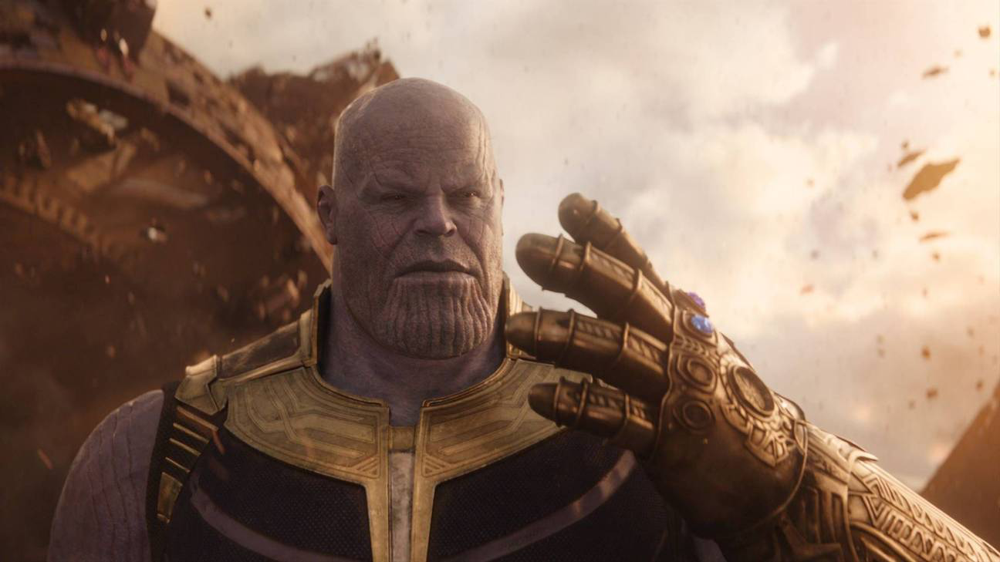

In [54]:
base_image, base_label, similar_images_df = get_similar_images_annoy(620)
print(base_label)
open_image(base_image)

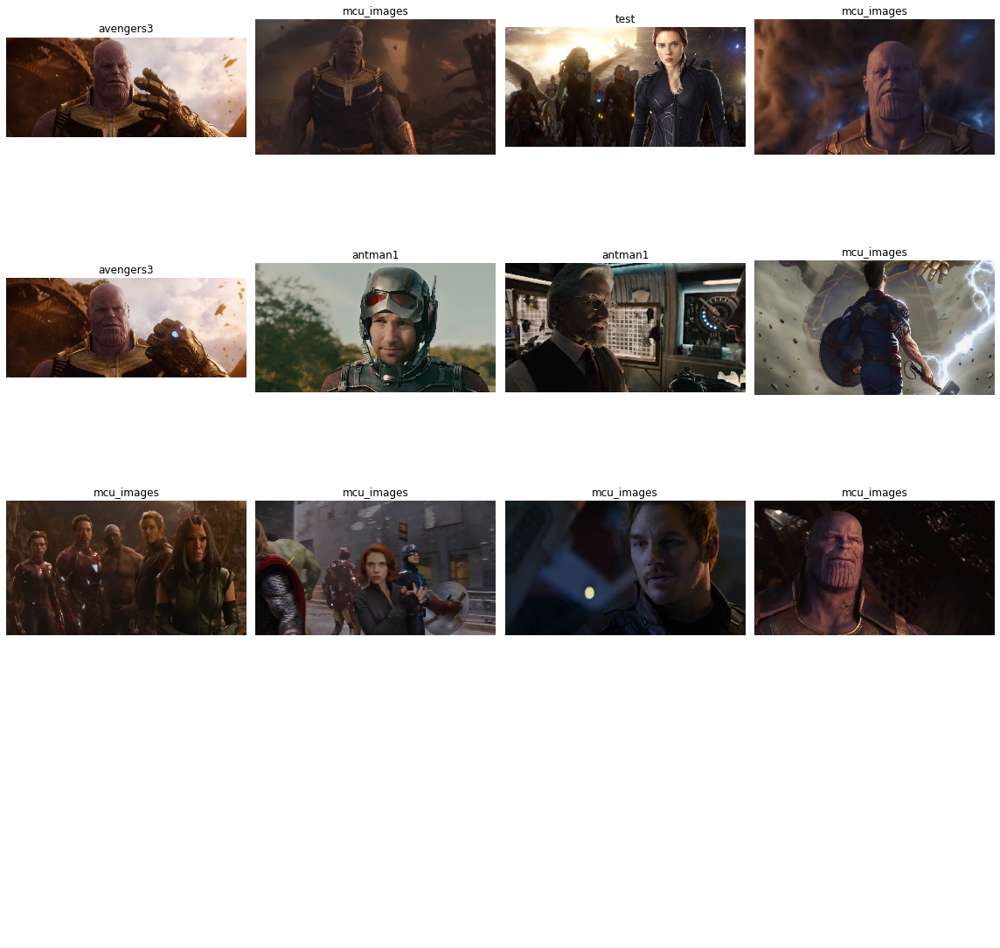

In [55]:
show_similar_images(similar_images_df)

test


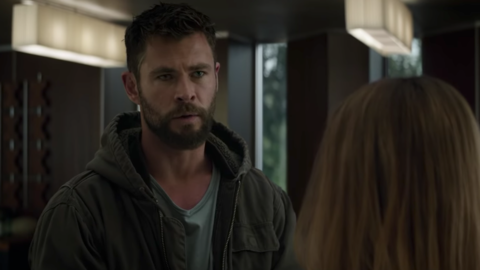

In [33]:
base_image, base_label, similar_images_df = get_similar_images_annoy(649)
print(base_label)
open_image(base_image)

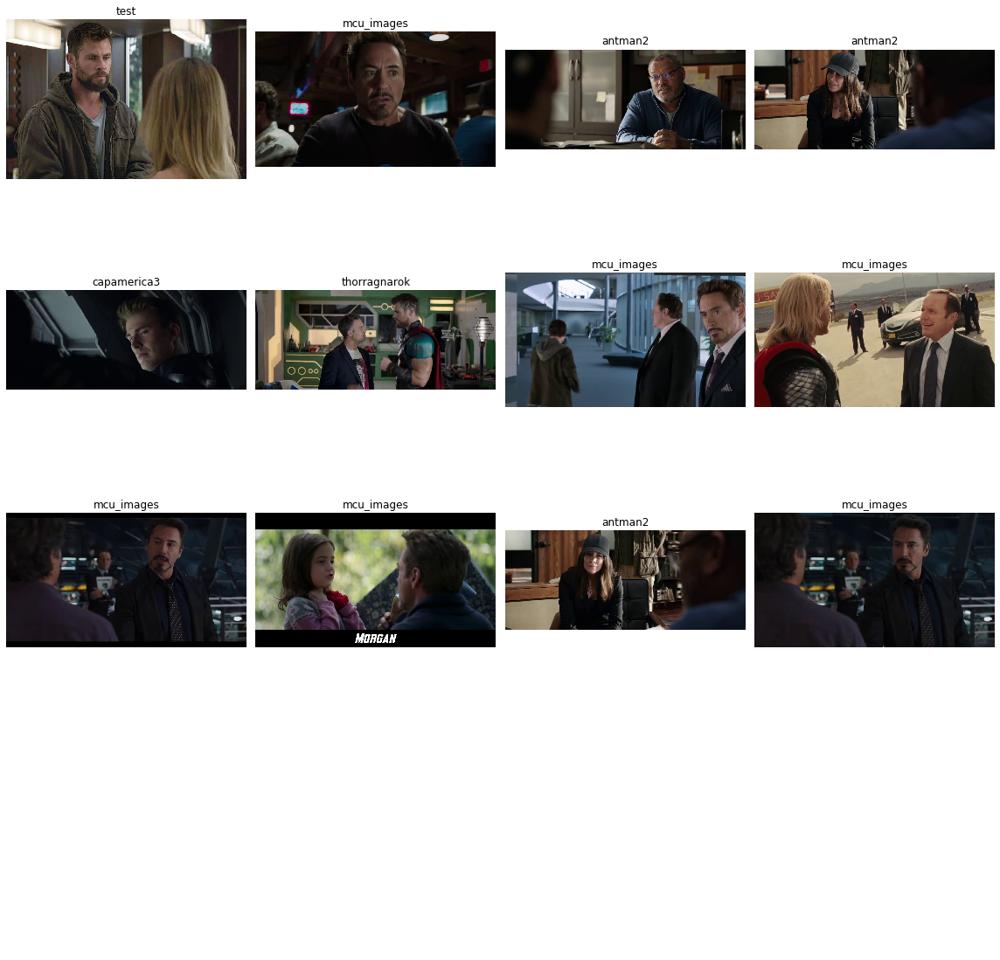

In [34]:
show_similar_images(similar_images_df)

0.8337497711181641 ms
test


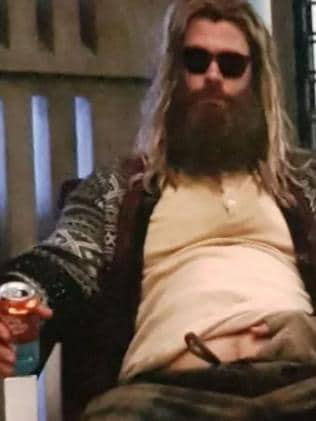

In [44]:
base_image, base_label, similar_images_df = get_similar_images_annoy(645)
print(base_label)
open_image(base_image)

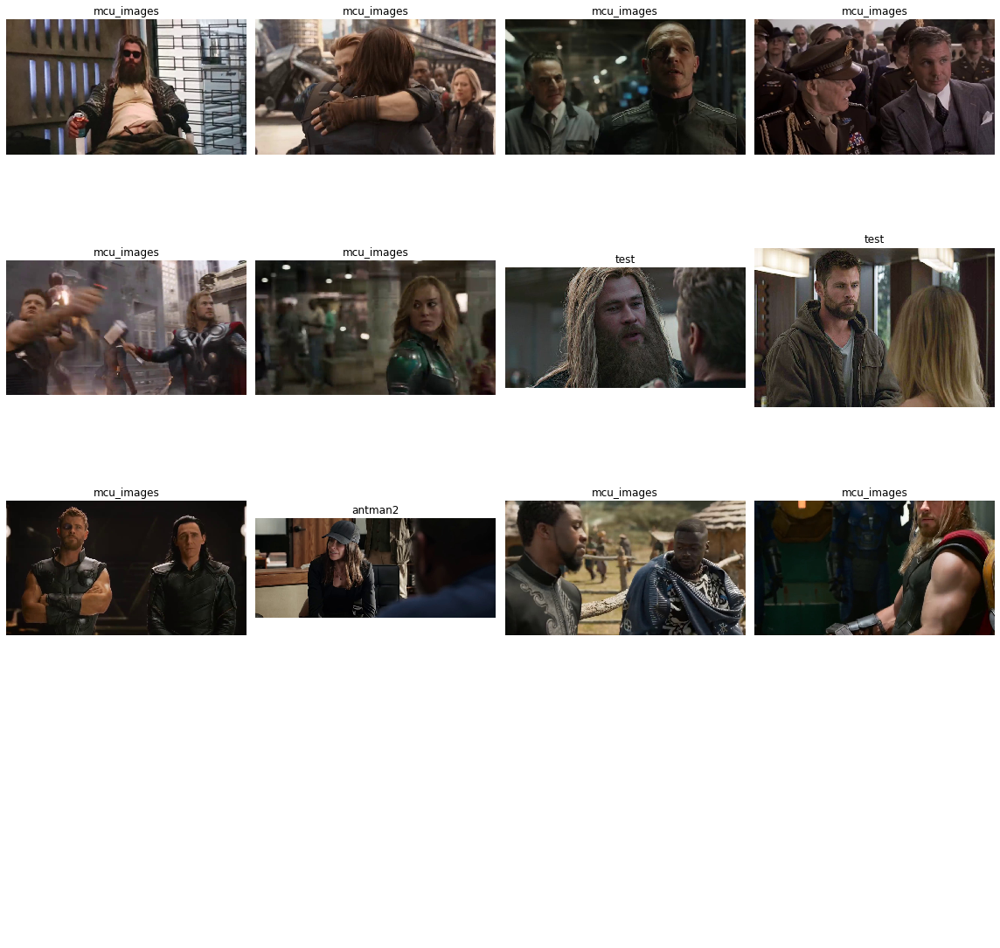

In [45]:
show_similar_images(similar_images_df)

0.9133815765380859 ms
mcu_images


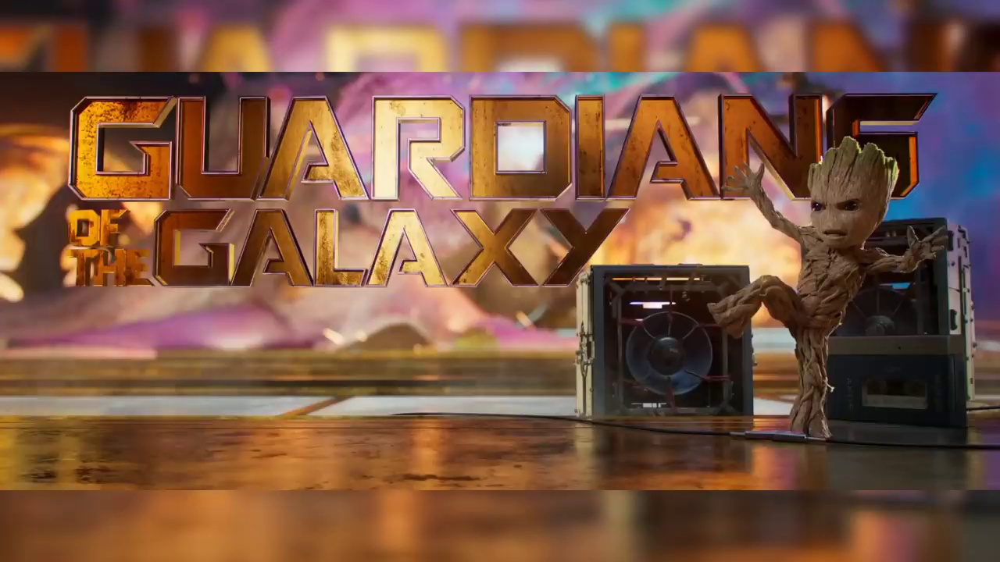

In [64]:
base_image, base_label, similar_images_df = get_similar_images_annoy(995)
print(base_label)
open_image(base_image)

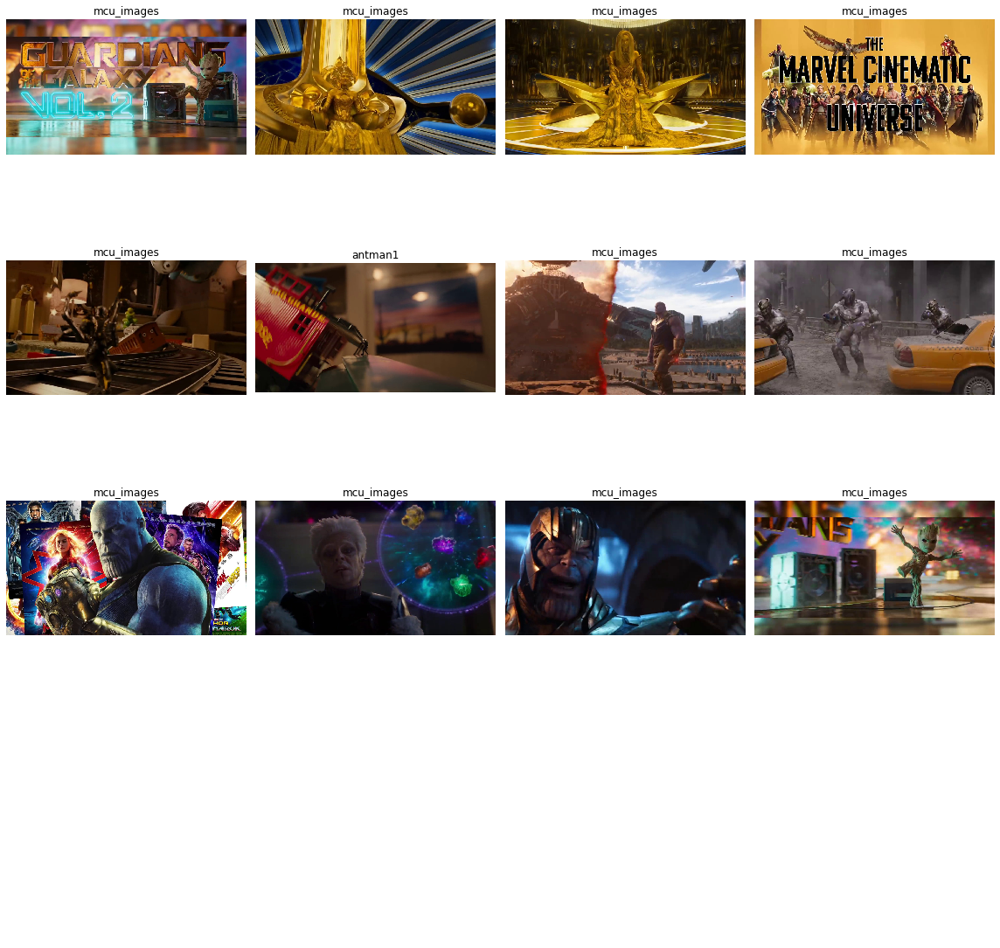

In [65]:
#similar_images_df
show_similar_images(similar_images_df)

0.8492469787597656 ms
thorragnarok


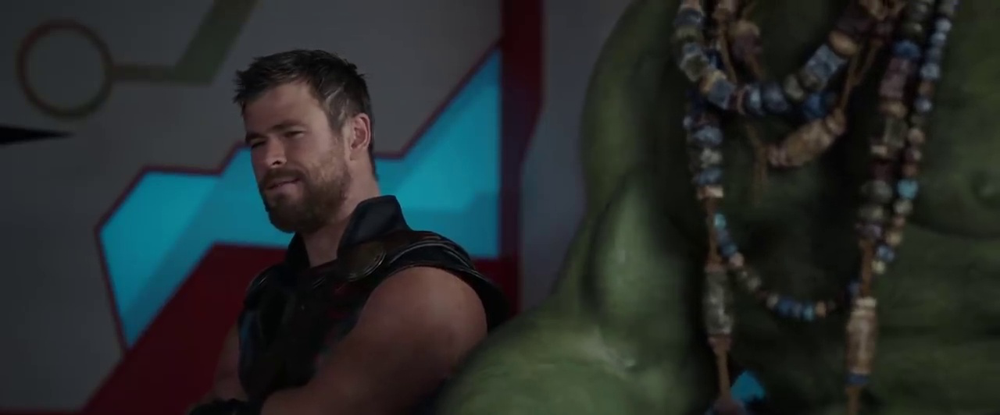

In [164]:
base_image, base_label, similar_images_df = get_similar_images_annoy(6)
print(base_label)
open_image(base_image)

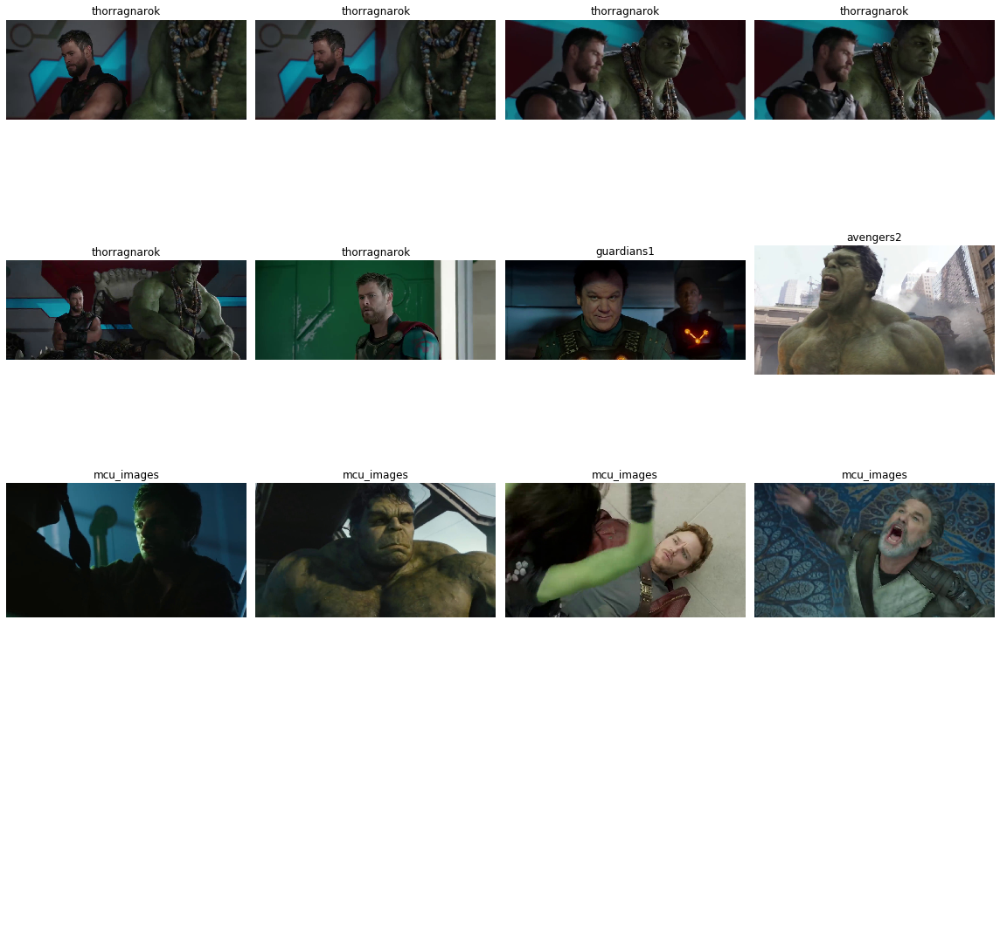

In [165]:
#similar_images_df
show_similar_images(similar_images_df)

1.184225082397461 ms
thorragnarok


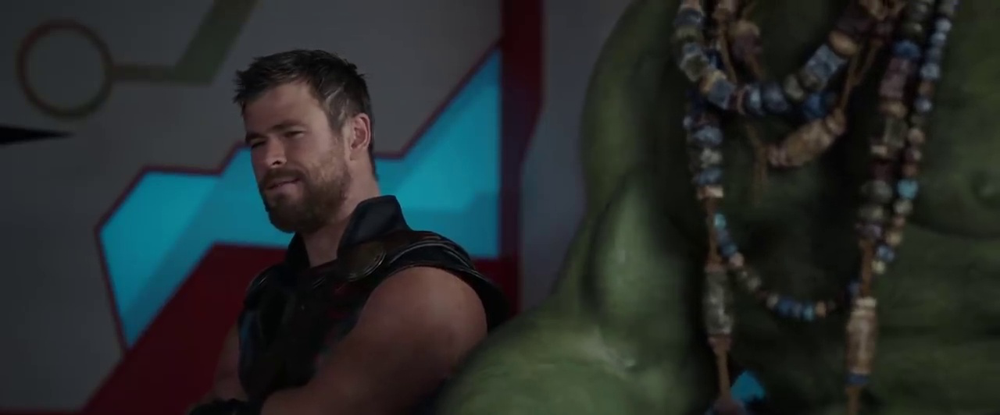

In [214]:
base_image, base_label, similar_images_df = get_similar_images_annoy(6)
print(base_label)
open_image(base_image)

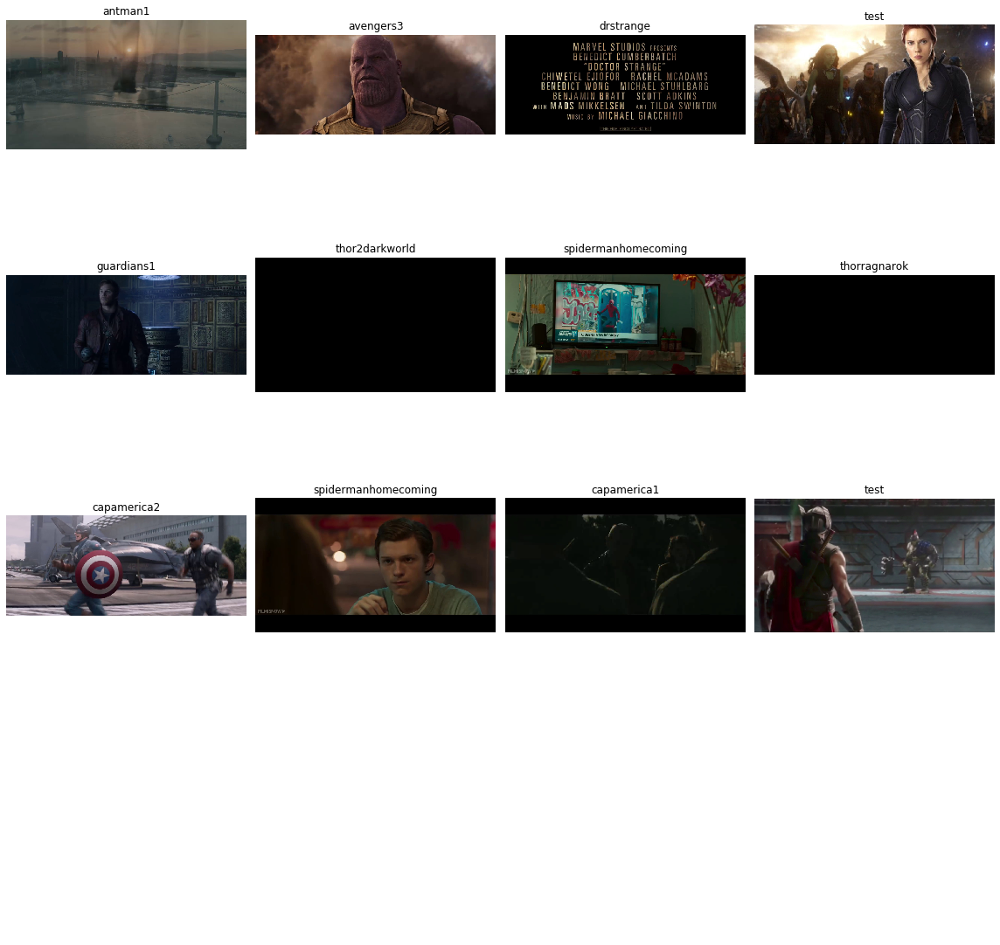

In [215]:
#similar_images_df
show_similar_images(similar_images_df)

In [149]:
img_repr_df.head()

,img_id,img_repr,label,label_id,tsne1,tsne2,tsne3
0,images/image_folders/thorragnarok/thorragnarok...,"[0.0, 4.040112, 10.632252, 0.0, 2.5859754, 2.3...",thorragnarok,20,29.832071,-19.614811,13.941854
1,images/image_folders/thorragnarok/thorragnarok...,"[4.0882225, 0.0, 5.715182, 1.1133897, 1.532563...",thorragnarok,20,23.519255,68.119049,-2.398109
2,images/image_folders/thorragnarok/thorragnarok...,"[0.0, 2.4437551, 0.0, 0.0, 0.0, 1.7523049, 0.4...",thorragnarok,20,14.895137,-14.509175,-27.229658
3,images/image_folders/thorragnarok/thorragnarok...,"[0.0, 1.0511644, 0.0, 0.0, 4.8144817, 9.652169...",thorragnarok,20,23.114428,0.201965,-16.547590
4,images/image_folders/thorragnarok/thorragnarok...,"[0.0, 0.6240043, 4.0688667, 0.0, 0.0, 3.455039...",thorragnarok,20,12.125875,-23.982780,-13.079291


---
## Experiment

In [72]:
def calculate_scores_dist(images, dist='euclidean'):
    distances = pairwise_distances(images.reshape(len(images), -1), metric= dist)[0]
    for i,d in enumerate(distances):
        print('{} for image {:.4f}; {:.4f}'.format(dist, i, d))

In [199]:
import nmslib

def create_index(a):
    index = nmslib.init(method='hnsw', space='l2')
    index.addDataPointBatch(a)
    index.createIndex()
    return index

def get_knns(index, vecs):
     return zip(*index.knnQueryBatch(vecs, k=10, num_threads=4))

def get_knn(index, vec): return index.knnQuery(vec, k=10)

In [202]:
predictions_test = learn.get_preds()
pred_test_wv = predictions_test[0].numpy()
nn_predtestwv = create_index(pred_test_wv)

In [207]:
predictions_test[0]

tensor([[1.9360e-01, 1.8790e-03, 2.1264e-03,  ..., 3.2782e-05, 2.5099e-04,
         4.4570e-04],
        [1.3564e-04, 8.7385e-04, 2.1527e-05,  ..., 3.8581e-05, 3.5320e-04,
         2.5403e-03],
        [5.8937e-02, 9.8784e-03, 4.2492e-04,  ..., 1.4689e-02, 8.1987e-04,
         2.0452e-02],
        ...,
        [1.3742e-02, 2.8088e-03, 1.7212e-03,  ..., 1.1604e-02, 2.1458e-03,
         1.9946e-02],
        [2.5577e-06, 2.3470e-04, 3.5435e-06,  ..., 5.8949e-06, 5.5158e-04,
         1.9964e-05],
        [8.0752e-07, 1.3818e-06, 2.6284e-07,  ..., 2.3903e-05, 9.6130e-04,
         6.9132e-06]])

In [210]:
def show_knn_img(fvec):
    idxs,dists = get_knn(nn_predtestwv, fvec)
    show_all([data.train_ds[i][0] for i in idxs[:9]], 3, 3, figsize=(8, 8))

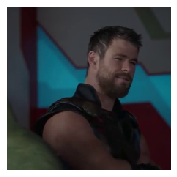

In [212]:
img, ground_p = data.train_ds[6]
img.show()

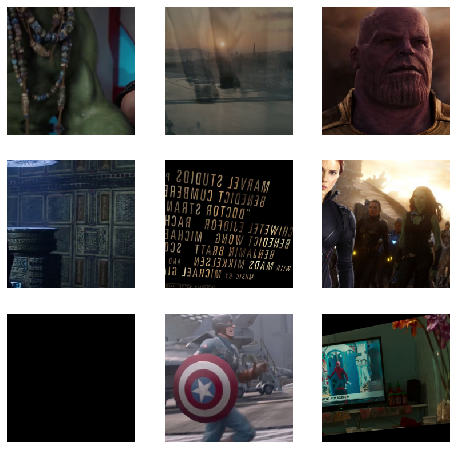

In [213]:
show_knn_img(pred_test_wv[6])

In [ ]:
nn_predtestwv = create_index(pred_test_wv)